# House Price Prediction

    Import necessary libraries

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import scipy
import scipy.stats as stats
from scipy.stats import skew,boxcox_normmax, zscore
from scipy.special import boxcox1p
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer,KNNImputer
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, make_scorer, mean_absolute_error 
from sklearn.model_selection import KFold, RandomizedSearchCV
from mlxtend.regressor import StackingCVRegressor
from multiprocessing import cpu_count
from lightgbm import LGBMRegressor
import matplotlib.pyplot as plt
import xgboost as xgb
import seaborn as sns

    Load dataset

In [2]:
df_data = pd.read_csv('home-data-for-ml-course/train.csv')

In [148]:
len(df_data.columns)

81

#        Exploratory Data Analysis

In [3]:
df_data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [4]:
print(df_data.columns)

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
print(len(df_data))

1460


In [6]:
df = df_data.copy()

In [7]:
print(df.dtypes)

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object


In [8]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

#    Detect Outliers

    1) Using box plot

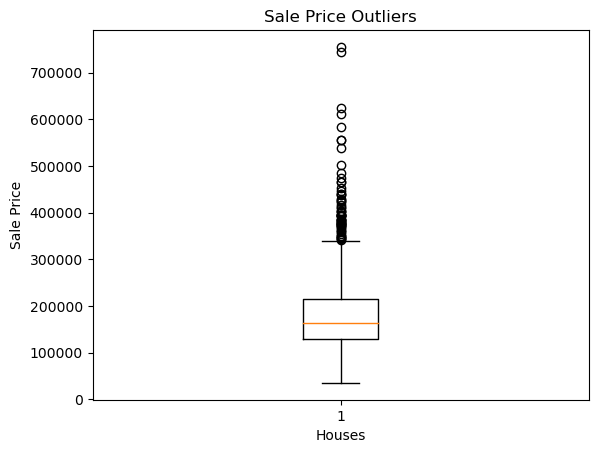

In [10]:
import matplotlib.pyplot as plt
import numpy as np


# Create a boxplot
fig, ax = plt.subplots()
ax.boxplot(df.SalePrice)

# Add labels and title
ax.set_xlabel('Houses')
ax.set_ylabel('Sale Price')
ax.set_title('Sale Price Outliers')

plt.show()


    2) Using Z-score

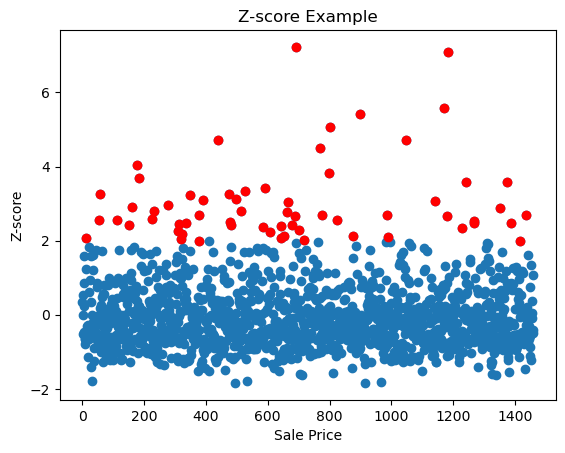

In [11]:
from scipy import stats

# Calculate the Z-score of each data point
z_score = stats.zscore(df.SalePrice)

# Find the index of the outliers
outlier_idx = np.where(np.abs(z_score) > 2)


# Create a scatter plot of the Z-scores
fig, ax = plt.subplots()
ax.scatter(np.arange(len(df)), z_score)

# Highlight the outliers
ax.scatter(outlier_idx, z_score.iloc[outlier_idx], color='red')

# Add labels and title
ax.set_xlabel('Sale Price')
ax.set_ylabel('Z-score')
ax.set_title('Z-score Example')

plt.show()

    3) Using DBSCAN

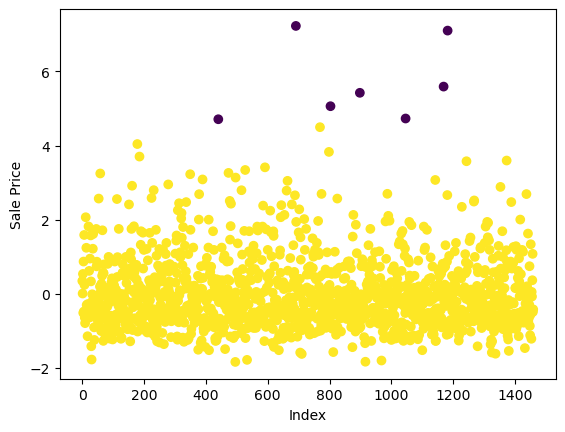

In [12]:
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler


# Select the Sale Price column
sale_price = df['SalePrice'].values.reshape(-1, 1)

# Scale the data
scaler = StandardScaler()
sale_price = scaler.fit_transform(sale_price)

# Use DBSCAN to cluster the data
dbscan = DBSCAN(eps=0.5, min_samples=5)
labels = dbscan.fit_predict(sale_price)

# Plot the clusters
plt.scatter(range(len(sale_price)), sale_price, c=labels)
plt.xlabel('Index')
plt.ylabel('Sale Price')
plt.show()


4) Remove outliers using IQR

In [13]:
# Calculate the IQR and upper/lower bounds
Q1 = df['SalePrice'].quantile(0.25)
Q3 = df['SalePrice'].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR

# Select only the data points that are within the bounds
df = df[(df['SalePrice'] >= lower_bound) & (df['SalePrice'] <= upper_bound)]



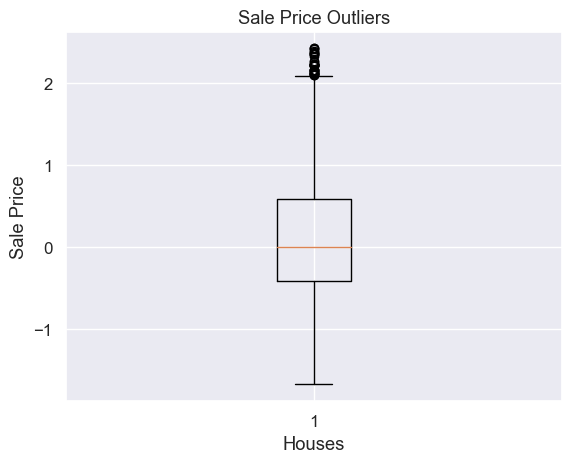

In [203]:
# Create a boxplot
fig, ax = plt.subplots()
ax.boxplot(df.SalePrice)

# Add labels and title
ax.set_xlabel('Houses')
ax.set_ylabel('Sale Price')
ax.set_title('Sale Price Outliers')

plt.show()

        Find features which is null

In [14]:
df.columns[df.isnull().any()]



Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

In [15]:
df['LotFrontage'].describe()

count    1143.000000
mean       69.058618
std        23.813289
min        21.000000
25%        59.000000
50%        68.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

<AxesSubplot:>

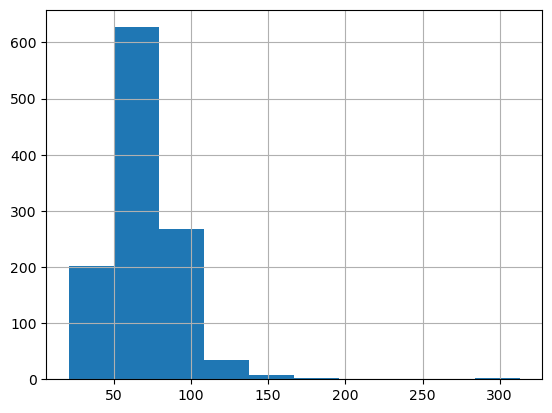

In [16]:
df['LotFrontage'].hist()

In [17]:

df['LotFrontage'].fillna(np.mean(df['LotFrontage']), inplace = True)

<AxesSubplot:>

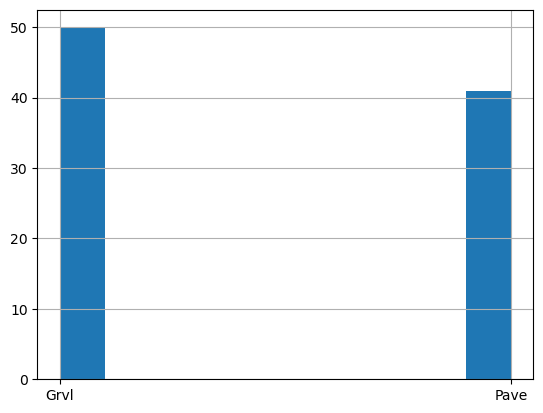

In [18]:
df.Alley.hist()

In [19]:
df['Alley'].isnull().sum()/len(df['Alley'])

0.9349535382416011

    It has a big percentage of missing values

        Visualize distribution of numerical features

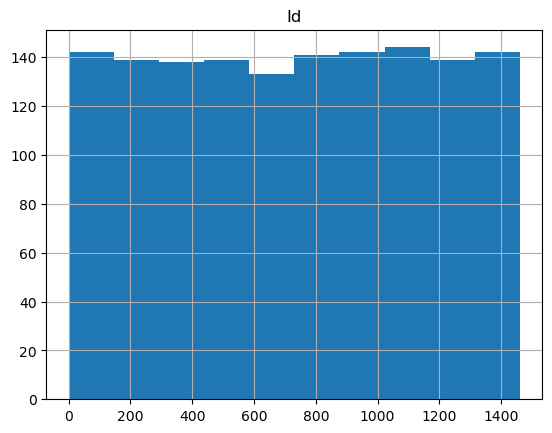

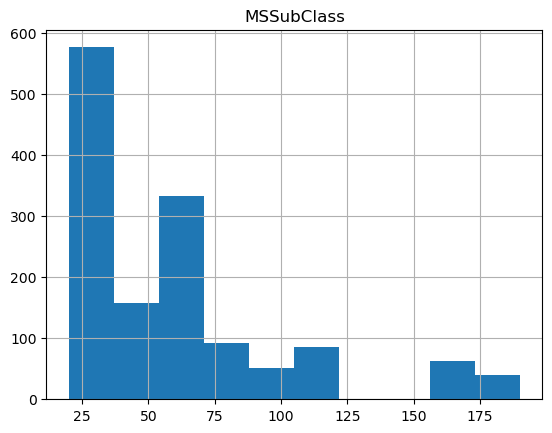

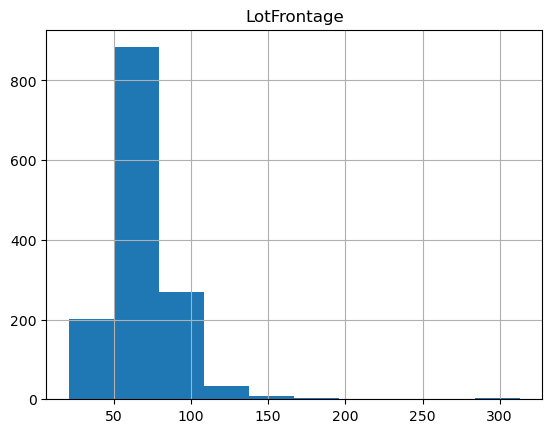

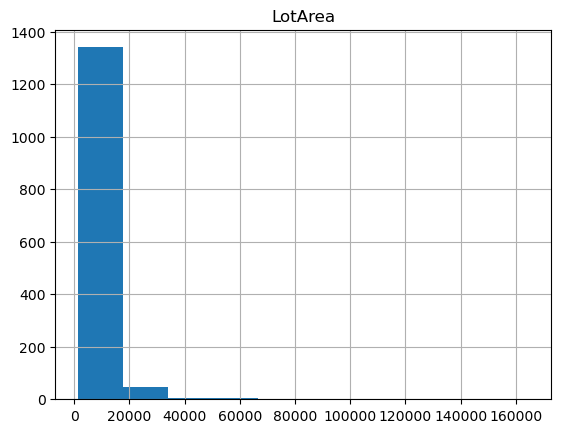

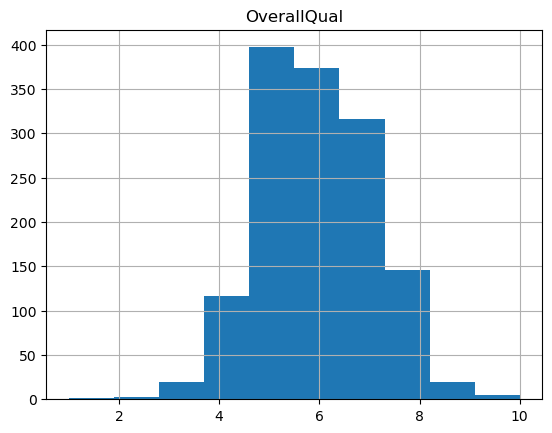

...

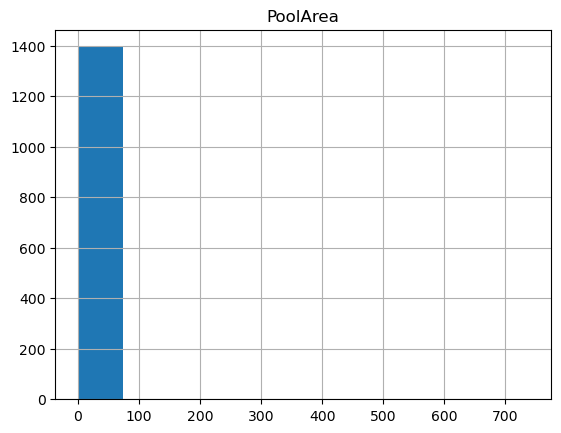

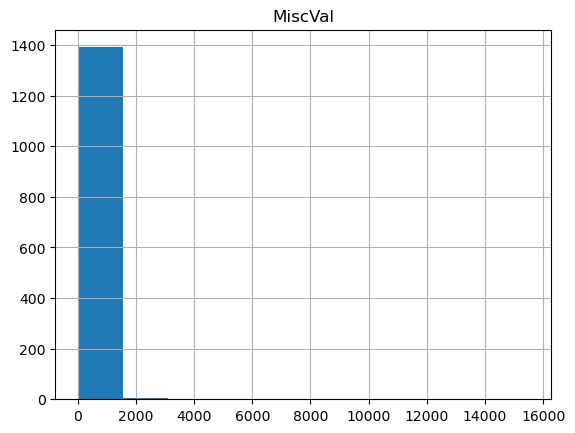

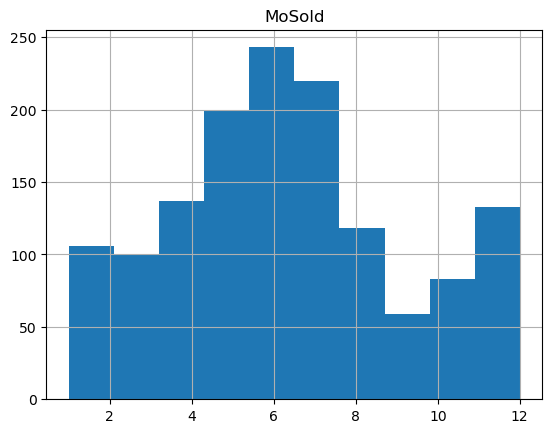

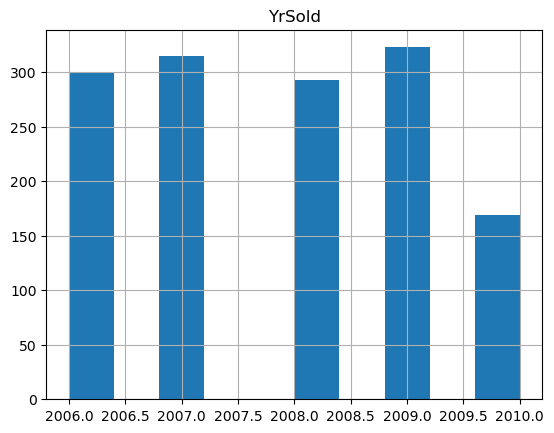

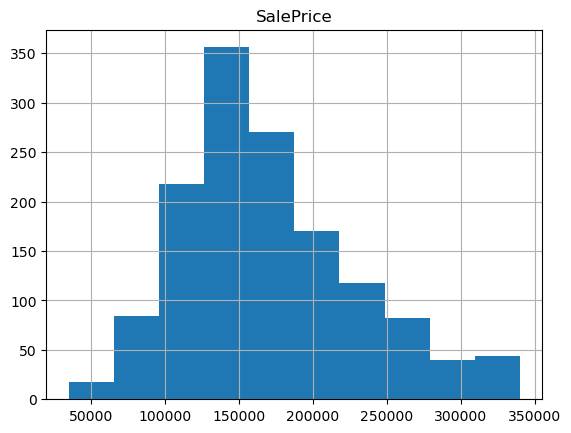

In [20]:
# loop through each column in the DataFrame
for col in df.columns:

    # check if the column is numerical
    if df[col].dtype in ['int64', 'float64']:
        
        # plot a boxplot of the column
        df[[col]].hist()
        plt.title(col)
        plt.show()

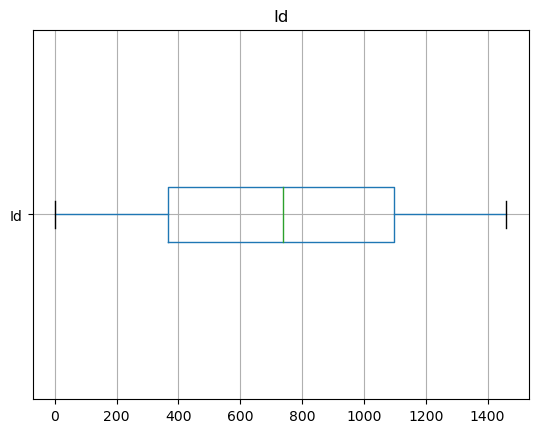

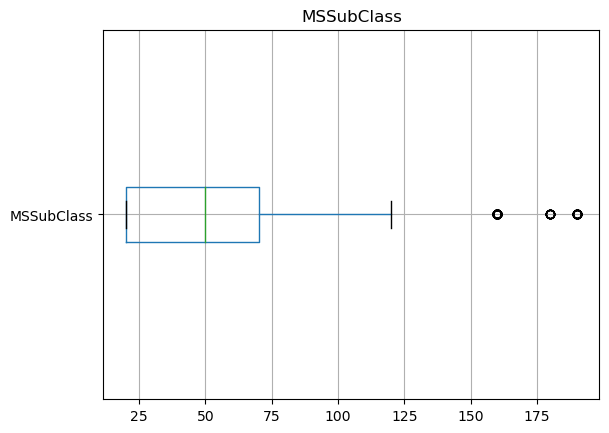

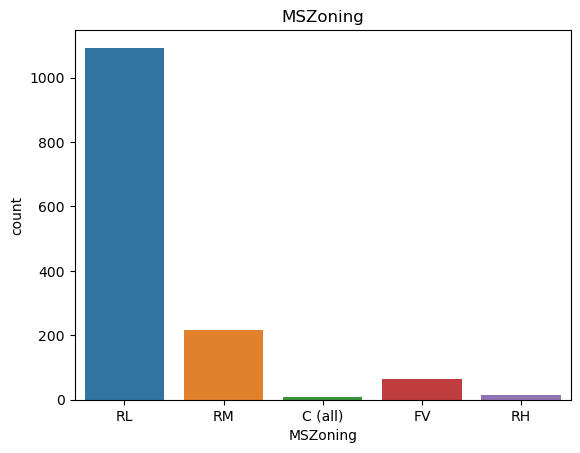

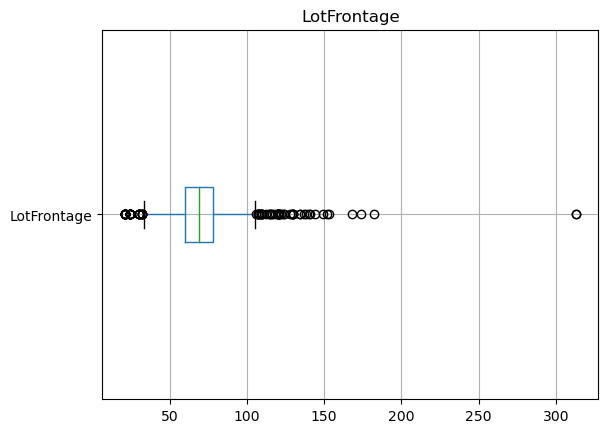

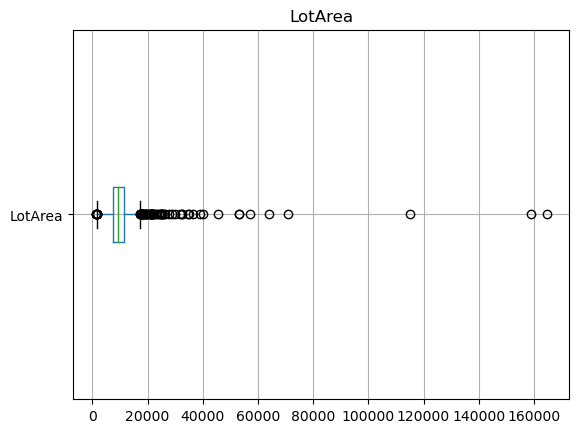

...

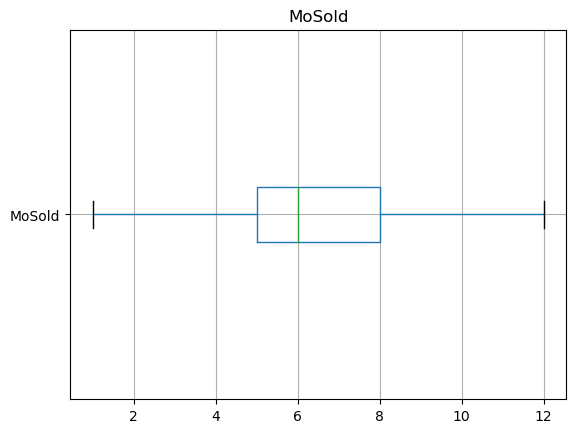

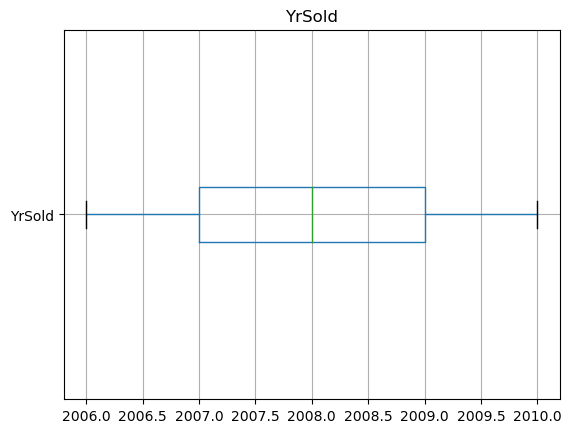

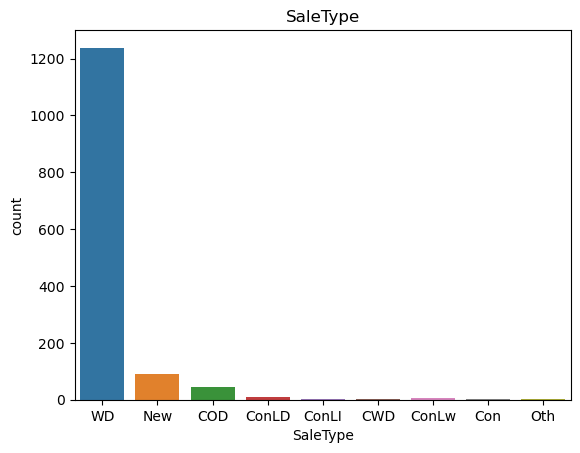

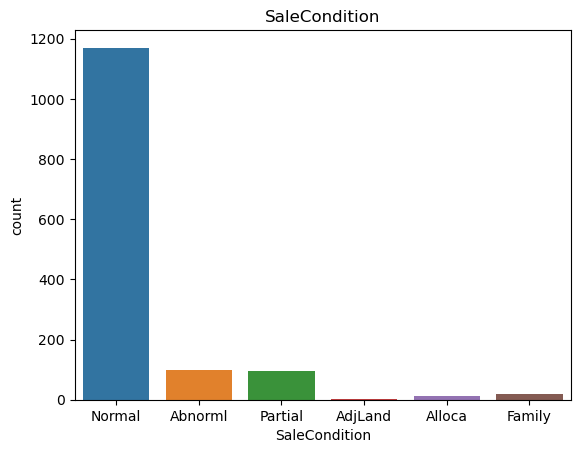

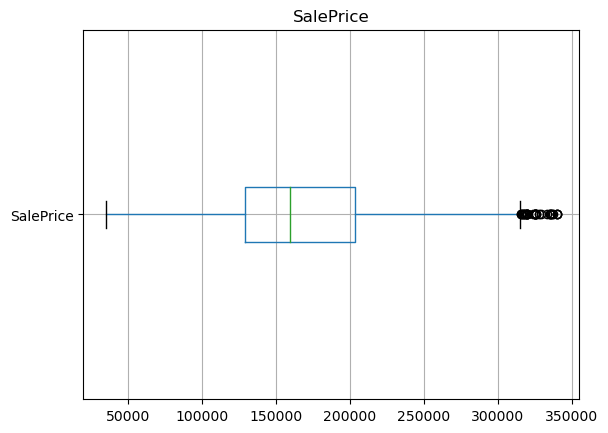

In [21]:
import seaborn as sns

# loop through each column in the DataFrame
for col in df.columns:

       
    # check if the column is categorical
    if df[col].dtype == 'object':
        
        # plot a countplot of the column
        sns.countplot(data=df, x=col)
        plt.title(col)
        plt.show()
        
    
        # check if the column is numerical
    elif df[col].dtype in ['int64', 'float64']:
        
#         # plot a boxplot of the column
        df[[col]].boxplot(vert=False)
        plt.title(col)
        plt.show()


    Visualize correlation between features

In [22]:
sns.pairplot(df, diag_kind='hist')
plt.show()



    A few more to understand data

In [141]:
# pd.options.display.float_format = '{:,.2f}'.format #  # :.2f

# # group by city
# info_by_city = df.groupby('YearBuilt')['SalePrice'].agg(['count', 'mean', 'median', 'min', 'max'])
# print(info_by_city)
# df.groupby('city')[['price', 'bedrooms']].agg(['mean', 'median', 'count'])

# print(df.groupby('city').agg({'price': ['mean', 'median', 'min', 'max'], 'bedrooms': ['mean', 'median', 'min', 'max']}))

In [24]:
df.Electrical.nunique()

5

In [25]:
df.Street.unique()

array(['Pave', 'Grvl'], dtype=object)

In [26]:
df.GarageType.nunique()

6

In [27]:
len(df)

1399

    Visualize sale prices to see how they are distributed

C:\Users\ArifogluD\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:title={'center':'Log Normal'}, xlabel='SalePrice'>

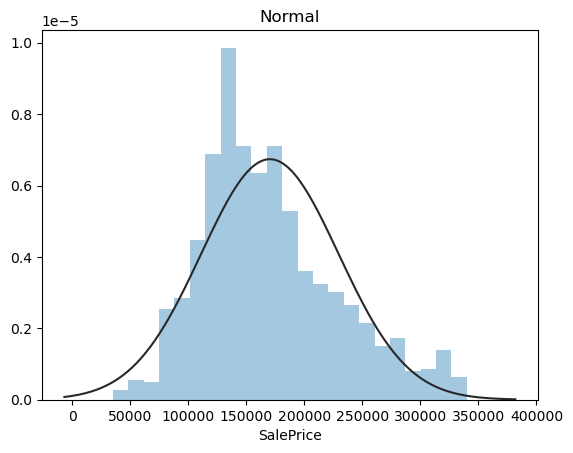

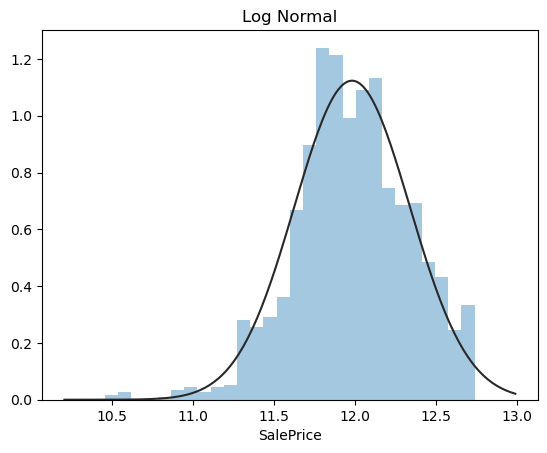

In [28]:
y1 = df['SalePrice']
plt.figure(2); plt.title('Normal')
sns.distplot(y1, kde=False, fit=stats.norm)

#Log Transform
y1 = np.log(df["SalePrice"])
plt.figure(3); plt.title('Log Normal')
sns.distplot(y1, kde=False, fit=stats.lognorm)

    Feature Correlation

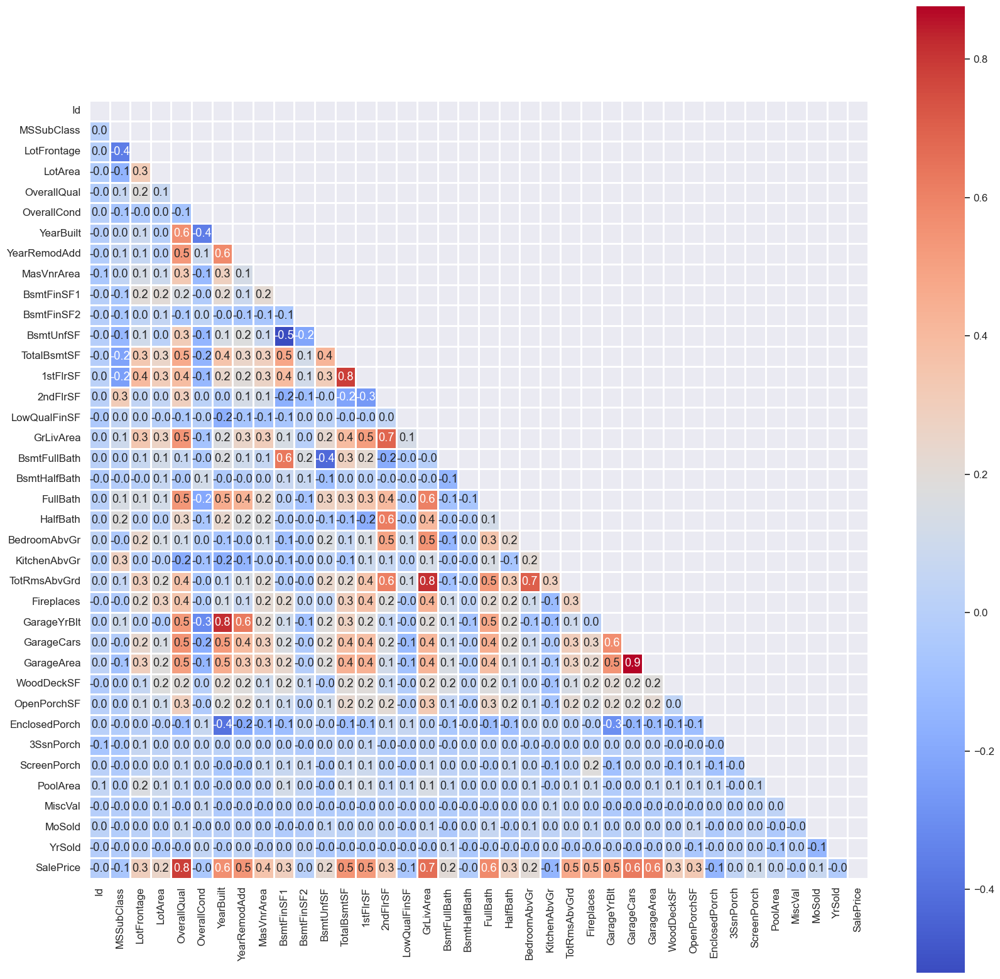

In [29]:
sns.set(font_scale=1.1)
corr_train = df.corr()
mask = np.triu(corr_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(corr_train, annot=True, fmt='.1f', cmap='coolwarm', square=True, mask=mask, linewidth=1, cbar=True)
plt.show()

# Data Imputation

In [30]:
f_nonefill = ["PoolQC", "MiscFeature", "Alley", "Fence", "FireplaceQu", "GarageCond", "GarageQual", "GarageFinish", "GarageType", "BsmtCond", "BsmtExposure", "BsmtQual", "BsmtFinType2", "BsmtFinType1"]
df[f_nonefill] = df[f_nonefill].fillna("None")

f_modefill = ["MasVnrType", "MSZoning", "Utilities", "Exterior1st", "Exterior2nd", "SaleType", "Electrical", "KitchenQual", "Functional"]
df[f_modefill] = df.groupby("Neighborhood")[f_modefill].transform(lambda x:x.fillna(x.mode()[0]))

In [31]:
f_medianfill = ["GarageArea", "LotFrontage"]
df[f_medianfill] = df.groupby("Neighborhood")[f_medianfill].transform(lambda x: x.fillna(x.median())) 

f_zerofill = ["GarageYrBlt", "MasVnrArea", "BsmtHalfBath", "BsmtFullBath", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "GarageCars"]
df[f_zerofill] = df[f_zerofill].fillna(0)



# Feature Engineering

In [32]:
# Add age of house feature
current_year = 2023
df['Age'] = current_year - df['YearBuilt']

# Add total number of bathrooms feature
df['TotalBath'] = df['FullBath'] + 0.5 * df['HalfBath']

# Add lot size feature
df['LotSize'] = df['LotFrontage'] * df['LotArea']


# Feature Normalization

In [39]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, RobustScaler

number_column = df.select_dtypes(np.number).columns
df[number_column] = RobustScaler().fit_transform(df[number_column])


# Feature Mapping

In [40]:
df = pd.get_dummies(df)

In [149]:
len(df.columns)

307

        Split dataset

In [48]:
from sklearn.model_selection import train_test_split
    
X_train, X_test, y_train, y_test = train_test_split(df.drop(['SalePrice'], axis=1), 
                                                    df['SalePrice'], 
                                                    test_size=0.2, 
                                                    random_state=42)

In [49]:
from sklearn.model_selection import KFold, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, make_scorer, mean_absolute_error 

kf = KFold(n_splits=5, random_state=0, shuffle=True)

rmse = lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred))


In [53]:
def random_search(model, grid, n_iter=100):
    if model == xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, n_jobs=4):
        searchxg = RandomizedSearchCV(estimator = model, param_distributions = grid, cv=kf, n_iter = n_iter, n_jobs=4, random_state=0, verbose=True)
        return searchxg.fit(X_train,y,early_stopping_rounds=5,verbose=True)
    else:
        search = RandomizedSearchCV(estimator = model, param_distributions = grid, cv=kf, n_iter = n_iter, n_jobs=4, random_state=0, verbose=True)
        return search.fit(X_train, y_train)

In [51]:
#hyperparameters
xgb_params = {'n_estimators': [100, 400, 800],'max_depth': [3, 6, 9],'learning_rate': [0.05, 0.1, 0.20],'min_child_weight': [1, 10, 100]} #XGBoost
ridge_params = {"alpha": np.logspace(-1, 2, 500)} # ridge
lasso_params = {"alpha": np.logspace(-5, -1, 500)} # lasso
svr_params = {"C": np.arange(1, 100), "gamma": np.linspace(0.00001, 0.001, 50), "epsilon": np.linspace(0.01, 0.1, 50)} #Support Vector Regressor
lgbm_params = {"colsample_bytree": np.linspace(0.2, 0.7, 6), "learning_rate": np.logspace(-3, -1, 100)} #LGBM 
gbm_params = {"max_features": np.linspace(0.2, 0.7, 6), "learning_rate": np.logspace(-3, -1, 100)} #Gradient Boost
# cat_params = {'depth': [2,9], 'iterations': [10,30] ,'learning_rate': [0.001,0.1]}

        Train 6 regressor models

In [54]:
xgb_search = random_search(xgb.XGBRegressor(n_estimators=1000, n_jobs=4),xgb_params) 
ridge_search = random_search(Ridge(), ridge_params) 
lasso_search = random_search(Lasso(), lasso_params) 
svr_search = random_search(SVR(), svr_params,n_iter=100)
lgbm_search = random_search(LGBMRegressor(n_estimators=2000, max_depth=3), lgbm_params,n_iter=100) 
gbm_search = random_search(GradientBoostingRegressor(n_estimators=2000, max_depth=3),gbm_params,n_iter=100)

C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 81 is smaller than n_iter=100. Running 81 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 100 candidates, totalling 500 fits


    Now stack the best models

In [55]:
models = [search.best_estimator_ for search in [xgb_search,ridge_search, lasso_search, svr_search, lgbm_search, gbm_search]] 
ensemble_search = random_search(StackingCVRegressor(models,Ridge(), cv=kf), {"meta_regressor__alpha": np.logspace(-3, -2, 500)}, n_iter=20) # ensembling stack
models.append(ensemble_search.best_estimator_) # best models

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [57]:
prediction = [i.predict(X_test) for i in models] # find prediction by each model

C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but Ridge was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but Lasso was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  warnings.warn(


In [125]:
len(prediction)

7

    Take average of decisions

In [79]:
predictions = np.average(prediction, axis=0)

    Plot the results

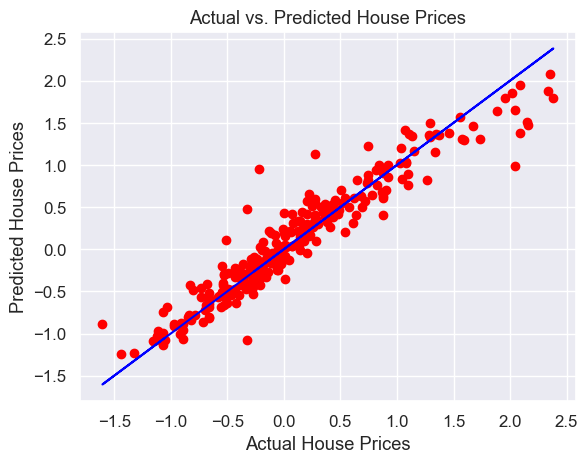

In [126]:

plt.scatter(y_test, predictions, color='red')
plt.plot(y_test, y_test, color='blue') 
plt.xlabel('Actual House Prices')
plt.ylabel('Predicted House Prices')
plt.title('Actual vs. Predicted House Prices')
plt.show()


# Error Analysis

In [ ]:
def adjusted_r2_score(y_pred, y_test, X_test):
    Adj_r2 = 1 - (1-r2_score(y_test, y_pred)) * (len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
    return Adj_r2

    Ensembling Regressor Models

In [135]:
from sklearn.metrics import mean_absolute_error, r2_score

mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)

print('MSE: ', mse)
print('MAE: ', mae)
adjusted_r2 = adjusted_r2_score(predictions, y_test, X_test)
r2 = r2_score(y_test, y_pred)
print('R squared', r2)
print("Adjusted R Squared", adjusted_r2)

MSE:  0.05162421696740468
MAE:  0.1528976028310481
R squared 0.8732826940769701
Adjusted R Squared 1.9308243245690906


    XGBoost

In [134]:
import xgboost as xg

xgb_r = xg.XGBRegressor()
xgb_r.fit(X_train, y_train)

y_pred = xgb_r.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred) 
r2 = r2_score(y_test, y_pred)
adjusted_r2 = adjusted_r2_score(y_pred, y_test, X_test)

print('MSE: ', mse) 
print("MAE", mae)
print("R Squared", r2)
print("Adjusted R Squared", adjusted_r2)


MSE:  0.0726209830636729
MAE 0.19229172619021564
R Squared 0.8732826940769701
Adjusted R Squared 2.309412161204642


    Linear Regression

In [133]:
reg = LinearRegression()

reg.fit(X_train,y_train)
y_pred = reg.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred) 
r2 = r2_score(y_test, y_pred)
adjusted_r2 = adjusted_r2_score(y_pred, y_test, X_test)

print('MSE: ', mse) 
print("MAE", mae)
print("R Squared", r2)
print("Adjusted R Squared", adjusted_r2)



MSE:  0.07519695044382188
MAE 0.1841120759029491
R Squared 0.8687878548061786
Adjusted R Squared 2.3558588336694877


# Show Importance of Each Feature using SHAP

In [193]:
import shap
shap.initjs()

explainer = shap.Explainer(xgb_r)
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


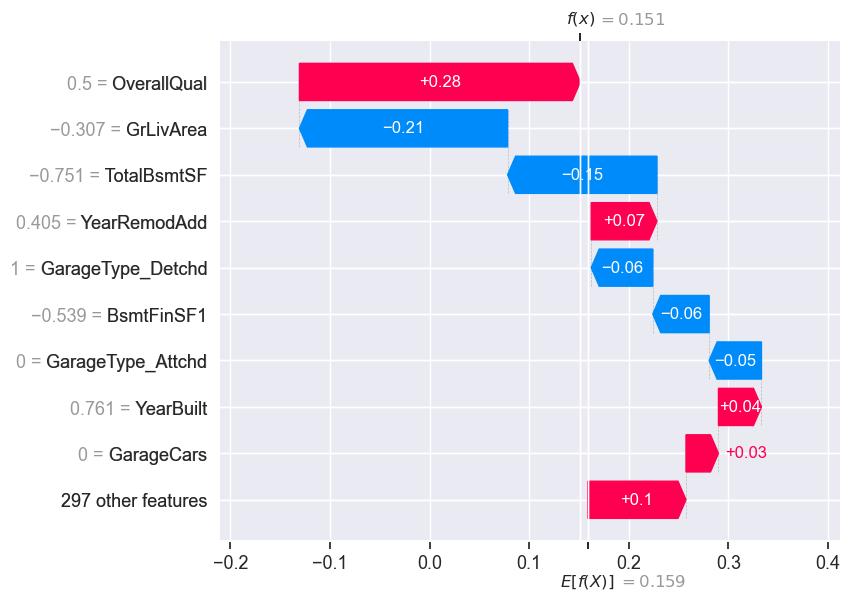

In [197]:
shap.plots.waterfall(shap_values[0])

In [196]:
shap.plots.force(shap_values[0])

In [200]:
shap.plots.force(shap_values[0:100])

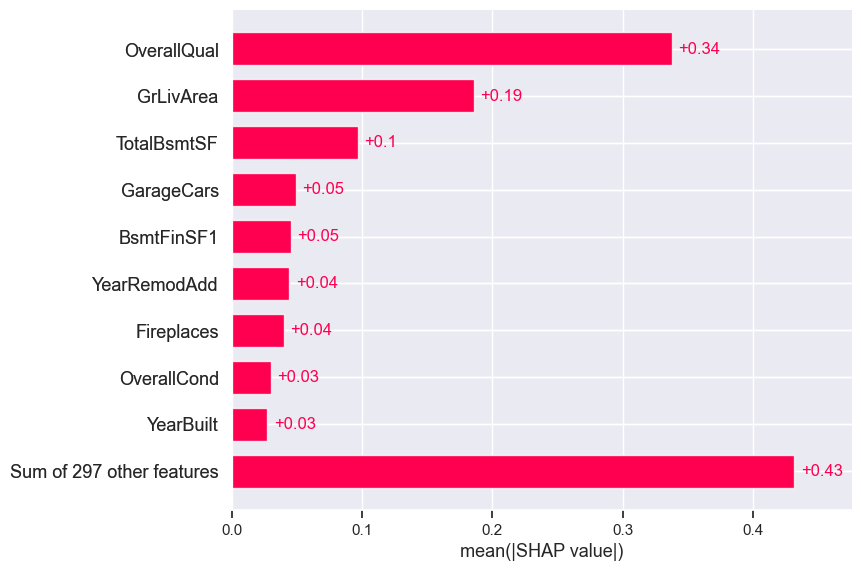

In [201]:
shap.plots.bar(shap_values)

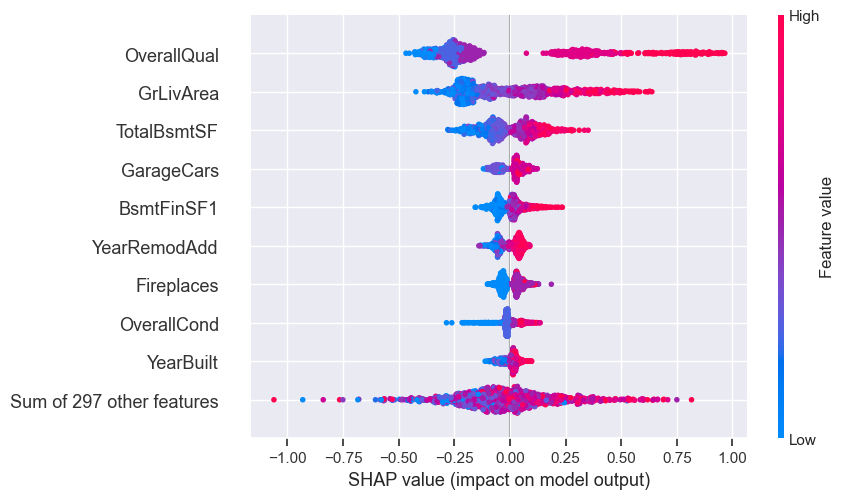

In [202]:
shap.plots.beeswarm(shap_values)

#    Predict sale prices for test data

In [164]:
df_test = pd.read_csv('home-data-for-ml-course/test.csv')

In [167]:
f_medianfill = ["GarageArea", "LotFrontage"]
df_test[f_medianfill] = df_test.groupby("Neighborhood")[f_medianfill].transform(lambda x: x.fillna(x.median())) 

f_zerofill = ["GarageYrBlt", "MasVnrArea", "BsmtHalfBath", "BsmtFullBath", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "GarageCars"]
df_test[f_zerofill] = df_test[f_zerofill].fillna(0)

f_nonefill = ["PoolQC", "MiscFeature", "Alley", "Fence", "FireplaceQu", "GarageCond", "GarageQual", "GarageFinish", "GarageType", "BsmtCond", "BsmtExposure", "BsmtQual", "BsmtFinType2", "BsmtFinType1"]
df_test[f_nonefill] = df_test[f_nonefill].fillna("None")

f_modefill = ["MasVnrType", "MSZoning", "Utilities", "Exterior1st", "Exterior2nd", "SaleType", "Electrical", "KitchenQual", "Functional"]
df_test[f_modefill] = df_test.groupby("Neighborhood")[f_modefill].transform(lambda x:x.fillna(x.mode()[0]))

In [168]:
# Add age of house feature
current_year = 2023
df_test['Age'] = current_year - df_test['YearBuilt']

# Add total number of bathrooms feature
df_test['TotalBath'] = df_test['FullBath'] + 0.5 * df_test['HalfBath']

# Add lot size feature
df_test['LotSize'] = df_test['LotFrontage'] * df_test['LotArea']

In [169]:
df_test = pd.get_dummies(df_test)

In [170]:
# Drop SalePrice column from df
df_without_saleprice = df.drop('SalePrice', axis=1)

# Reindex columns of df_test to match df (without SalePrice)
df_test = df_test.reindex(columns=df_without_saleprice.columns, fill_value=0)


In [171]:
df_test.isna().sum()

Id                       0
MSSubClass               0
LotFrontage              0
LotArea                  0
OverallQual              0
                        ..
SaleCondition_AdjLand    0
SaleCondition_Alloca     0
SaleCondition_Family     0
SaleCondition_Normal     0
SaleCondition_Partial    0
Length: 306, dtype: int64

In [172]:
print(len(df_test.columns))
print(len(df.columns))

306
307


In [173]:
prediction_test = [i.predict(df_test) for i in models] 

C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but Ridge was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but Lasso was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
C:\Users\ArifogluD\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  warnings.warn(


In [183]:
test_predictions = np.average(prediction_test, axis=0)

In [186]:
print(len(test_predictions))
print(len(df_test))

1459
1459


In [188]:
submission = pd.DataFrame({'Id': df_test['Id'], 'SalePrice':  test_predictions})

# Write the submission DataFrame to a CSV file
submission.to_csv('submissions.csv', index=False)